<a href="https://colab.research.google.com/github/MelikbekyanAshot/Data-Science/blob/main/Style-Transfer/Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. Import Dependencies and Pretrained Model

In [1]:
import tensorflow_hub as hub
import tensorflow as tf
from matplotlib import pyplot as plt
import numpy as np
import cv2
from PIL import Image

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
plt.rcParams.update({'font.size': 22})

In [19]:
class StyleTransfer:
  """
  """
  def __init__(self, model):
    self.model = model

  def __load_img(self, img):
    max_dim = 512
    img = tf.io.read_file(img.filename)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

  def show_images(self, content_image, style_image, stylized_image):
    fig, ax = plt.subplots(1, 3, figsize=(25, 25))
    ax[0].imshow(content_image)
    ax[0].title.set_text('Content image')
    ax[0].axis('off')

    ax[1].imshow(style_image)
    ax[1].title.set_text('Style image')
    ax[1].axis('off')

    ax[2].imshow(stylized_image)
    ax[2].title.set_text('Stylized image')
    ax[2].axis('off')
 
  def transfer_style(self, content_image, style_image):
    content_image = self.__load_img(content_image)
    style_image = self.__load_img(style_image)
    stylized_image = self.model(tf.constant(content_image), tf.constant(style_image))[0]
    return self.__tensor_to_image(stylized_image)

  def __tensor_to_image(self, tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
      assert tensor.shape[0] == 1
      tensor = tensor[0]
    return Image.fromarray(tensor)

In [10]:
model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

In [20]:
style_transfer = StyleTransfer(model)

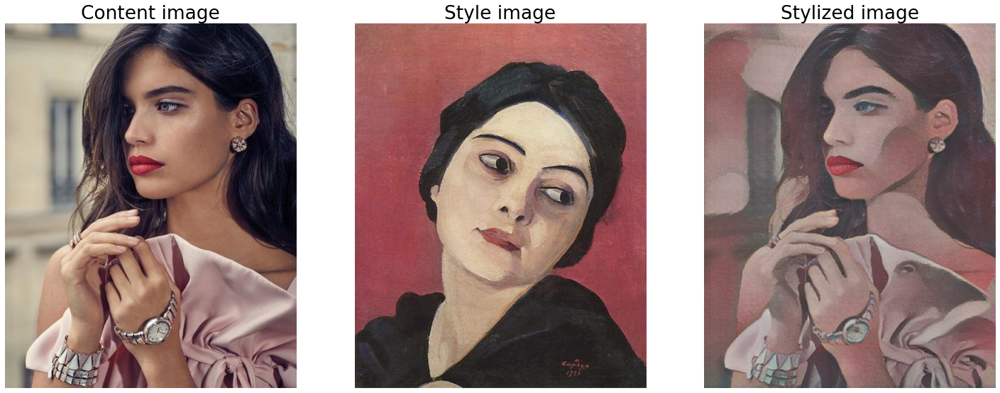

In [23]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/Head of the girl, 1923 - Martiros Sarian.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/girl.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)

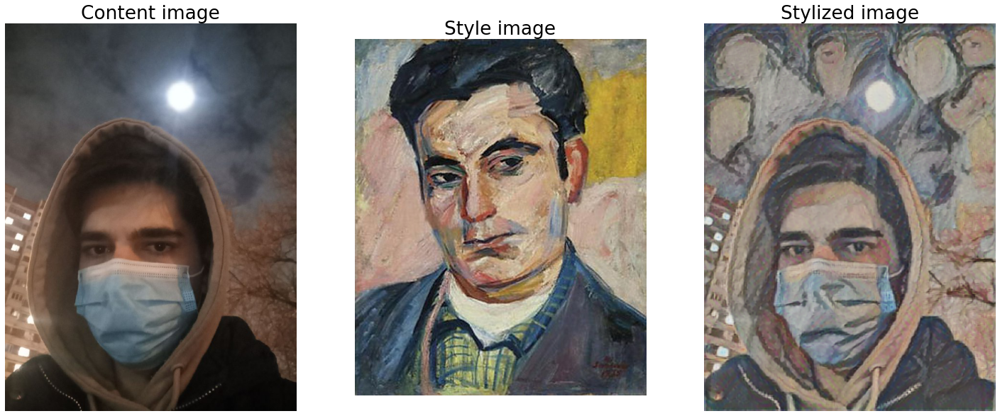

In [24]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/Portrait, 1935 - Martiros Sarian.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/me.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)

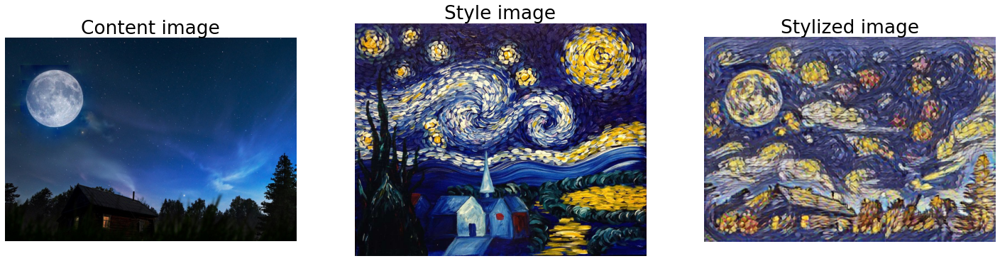

In [25]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/VanGoghStarryNight.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/nochi-iyunskie-polnyatsya-grezami.orig.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)

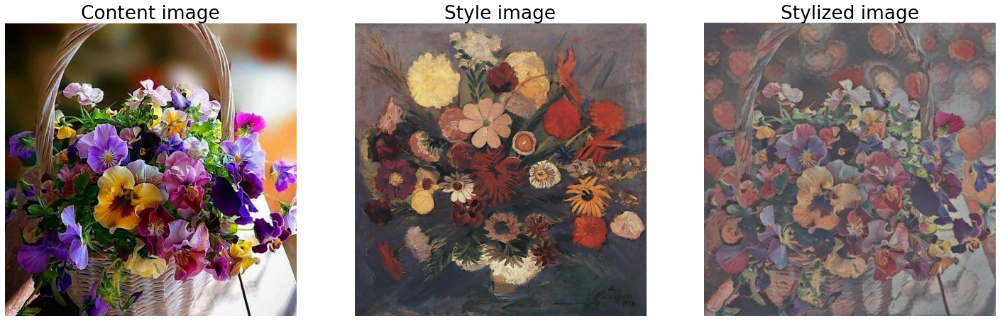

In [26]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/Flowers, 1928 - Martiros Sarian.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/flowers.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)

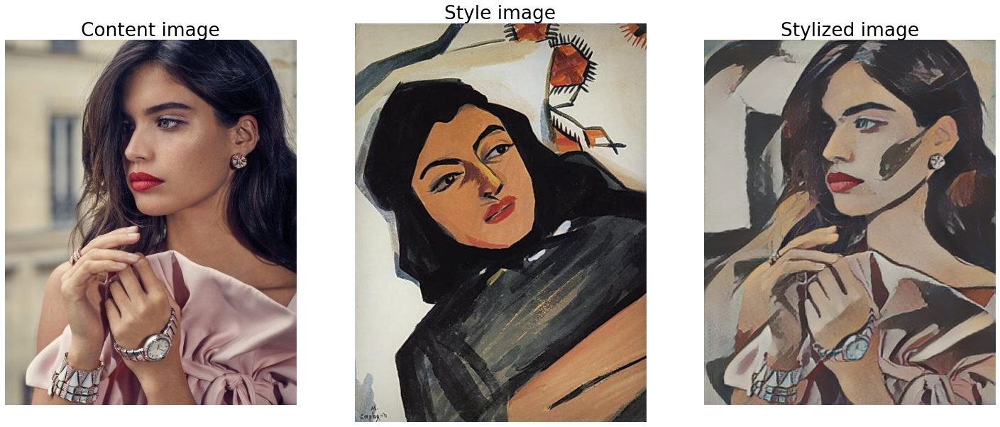

In [27]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/The head of the girl (Mariam Tazahulahyan), 1912 - Martiros Sarian.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/girl.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)

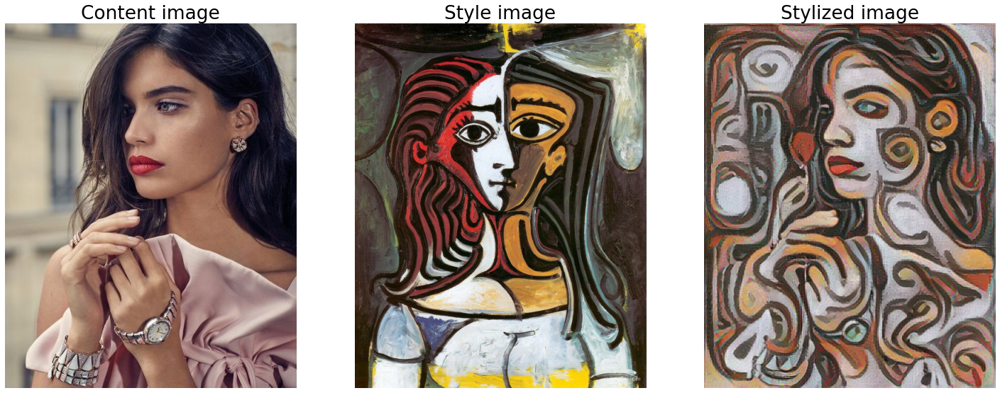

In [28]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/picasso.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/girl.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)

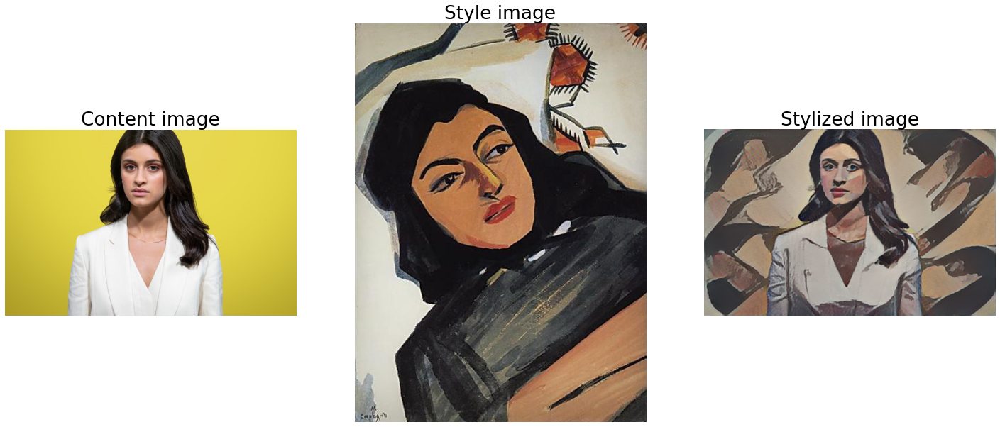

In [30]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/The head of the girl (Mariam Tazahulahyan), 1912 - Martiros Sarian.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/ania-chalotra.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)

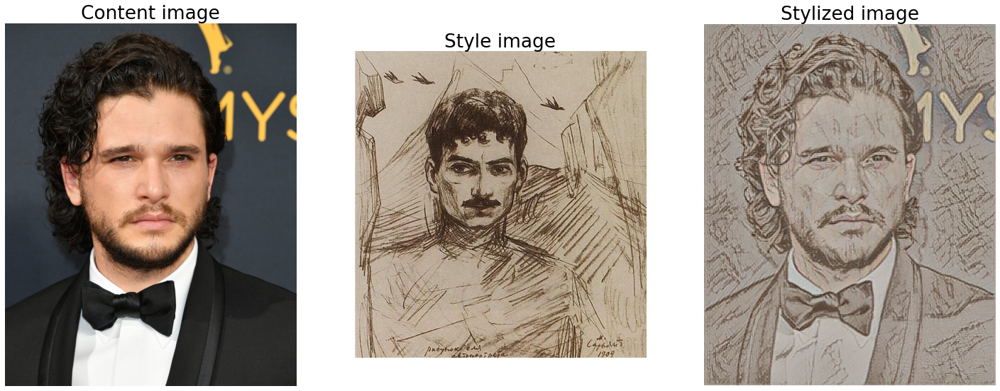

In [35]:
style_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Style Images/Self-portrait, 1909 - Martiros Sarian.jpg')
content_image = Image.open('/content/drive/MyDrive/Data Science/StyleTransfer/Content Images/KitHarington.jpg')
stylized_image = style_transfer.transfer_style(content_image, style_image)
style_transfer.show_images(content_image, style_image, stylized_image)